# Lecture 17
Recap : last lecture (#16) was the assignment.


# Analyzing Return Metrics

Quantitative analysis involves evaluating the success or failure of an investment. One of the key ways to do this is to calculate the rate of return—that is, the percentage that the investment has gained or lost versus its initial cost. The rate of return is a fundamental calculation in the fintech sector and in the financial services industry as a whole.

In this lesson, you’ll use financial data and the Pandas library to calculate several metrics that the rate-of-return umbrella includes. These metrics are the following:

`Return on investment (ROI)`: A rate-of-return calculation that compares the initial price or value of an asset to its current price or value.

`Daily returns`: A rate-of-return calculation that compares the current value of a stock to its initial value. In this case, the current value is the closing price, and the initial value is the closing price on the previous day.

`Cumulative returns`: The sum of all the daily return calculations over a specified time period.

All three metrics measure the rate of return for an investment or asset, but they involve different time periods and perspectives. You’ll use Pandas to automate these calculations and to then visualize the results.

`ROI`:
The ROI is a percentage calculation that compares the current value of an investment to its initial cost, indicating either a gain or a loss.
including the following:

- The performance estimate that the initial plan for investment laid out.

- The performance of a similar investment over a competing time period.

The performance of a benchmark, such as a sector index or a full market index. Examples of sector indexes are the technology and biotech sectors. An example of a full market index is the S&P 500.

With the ROI, both quantitative financial analysts and investors can determine the success or failure of an investment. This helps them make more informed decisions about future investments.

## Calculate the ROI
To calculate return on investment, or ROI, we use the formula shown in the following image:
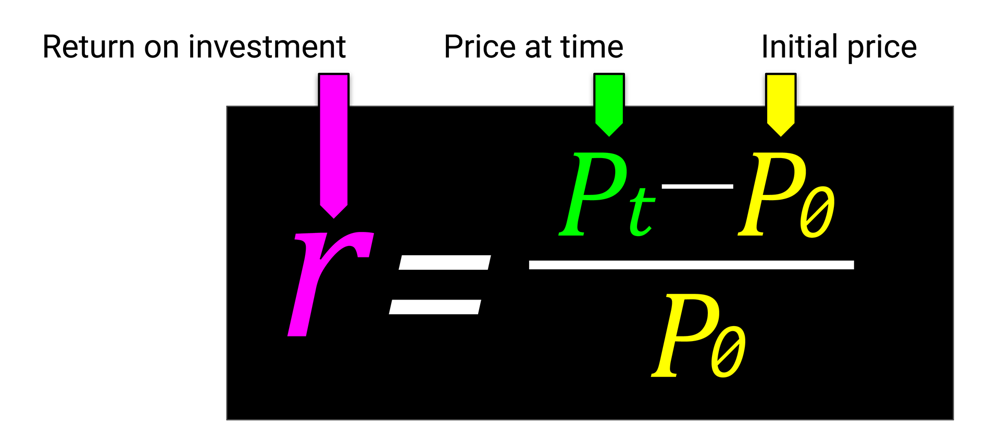

We subtract the initial cost of the investment from the current value of the same investment. We then divide this amount by the initial cost of the investment. The result is the ROI. We multiply the ROI by 100 to get the return percentage of the investment. The following code illustrates an example calculation:

In [9]:
# Current and initial values of the investment.
initial_investment_value = 100 # P0
current_investment_value = 110 # pt

# ROI Calculation - calculating the gain or loss of the current value of the investment versus the initial value of that investment
roi = (current_investment_value - initial_investment_value) / initial_investment_value # 0.1

# Converting the ROI calculation into a percentage by multiplying it by 100
roi_pct = roi * 100 # 10%

# Printing the result of our ROI Calculation
print(
    f"ROI for an initial investment of ${initial_investment_value} "
    f"now priced at ${current_investment_value} is {roi} or {roi_pct: .2f}%")

ROI for an initial investment of $100 now priced at $110 is 0.1 or  10.00%


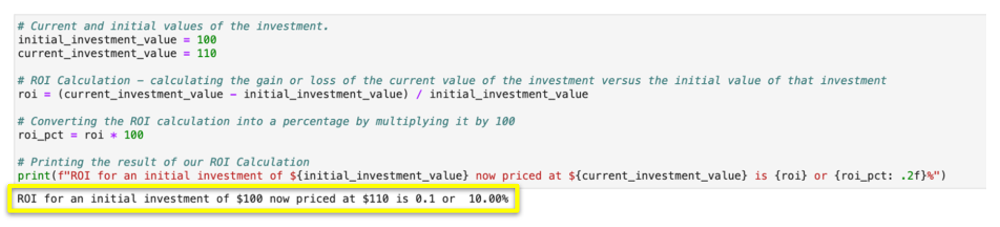

Using the ROI formula, an initial value of $100, and a current value of $110, the code calculates that the ROI equals 0.1, or 10%.

Now, open a Jupyter notebook, and then use the ROI formula to answer the following question:

------------------------------------------------------------------------------------------------
# Calculating Daily Returns with Pandas
For a quantitative financial analyst, one of the most common uses of the ROI formula is to determine the daily returns of a particular investment asset. The daily return measures the percentage of the increase or decrease of the investment between the closing price on the current day and that on the previous day.

We most commonly apply daily return calculations to individual stock or overall market performance. For example, the daily report on the NASDAQ, Dow Jones, S&P 500, or Russell 1000 corresponds to a measure of the daily return for each of those markets.

The following image shows the formula for calculating the daily return:

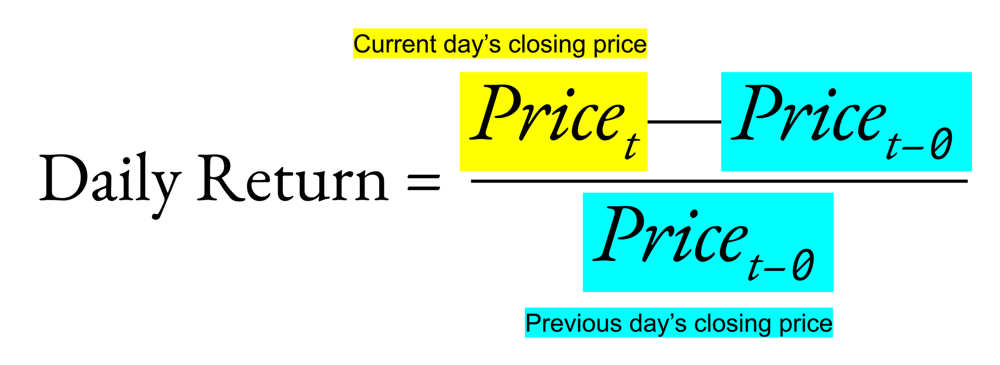

We subtract the closing price of the previous day from the closing price of the current day. We then divide the resulting number by the closing price of the previous day. The result is the daily return.

# Calculate Daily Returns with Pandas
Let’s apply this formula to an example. The following code calculates the daily return for the S&P 500:

In [10]:
# Establishing the current and previous closing prices of the S&P 500.
spx_current_close = 1884.660034
spx_prior_close = 1881.140015

# Daily Return Calculation
daily_return = ((spx_current_close - spx_prior_close ) / spx_prior_close) 

# Converting daily_return to a percentage value
daily_return_pct = daily_return * 100

# Printing the result
print(f"The daily return for the S&P 500 was {daily_return: .5f} or {daily_return_pct: .2f}%")

The daily return for the S&P 500 was  0.00187 or  0.19%


The following image shows the output from running the code:
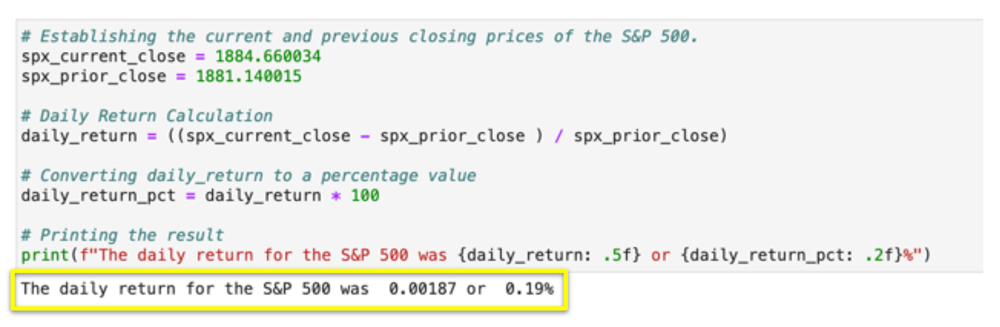

The code calculates that the daily return for the S&P 500 was 0.00187, or 0.19%.

The formula for calculating the daily return should seem similar to the one for calculating the ROI in the earlier example. Both are rate-of-return calculations, but they focus on different time periods. One calculates the return over the duration of the investment, and the other calculates the return over a period of one day.

Calculating the daily returns for an investment is a routine task for quantitative financial analysts. However, the process becomes tedious, because they need to do it every day, for every asset. Luckily, Pandas has functions that simplify and automate this task.

# The shift Function
Besides calculating a daily return over several days, well, daily, an analyst might have to calculate the return from week to week, month to month, or year to year. This process can be tedious and cumbersome.

Fortunately, Pandas has a function that makes this task more efficient. With the `shift` function, you can define the length of the period that you want to associate with the return calculation.

For example, `shift(1)` streamlines the process of daily return calculations by shifting the prices by one time period. Similarly, `shift(5)` applies to the return calculations for a week, and `shift(20)` applies to a four-week period. To ease the process of calculating the returns over a one-year period, we can use `shift(252)`. (One year has 252 trading days.)

## Apply the shift Function

The following code illustrates how the `shift` function works in daily return calculations:

In [11]:
# Read in the CSV as a DataFrame
sp500_csv = pd.read_csv(
    Path('../Resources/sp500_close.csv'),
    index_col="Date",
    parse_dates=True,
    infer_datetime_format=True
)

# View the first five rows of the DataFrame
sp500_csv.head()

# Use `shift()` with a parameter of 1 to shift every element in the 'Adj Close' column
sp500_csv["Shift_1"] = sp500_csv.shift(1)
sp500_csv.head()

NameError: name 'Path' is not defined

Let’s break down this code:

- We create a DataFrame that has the Adj Close prices of the S&P 500 over the series of days.

- We create a new column, named Shift_1, in the DataFrame. This column shifts all the elements in the Adj Close series down by a specified number of days. A parameter in the shift() function specifies this number. This particular code shifts all the elements by one day.

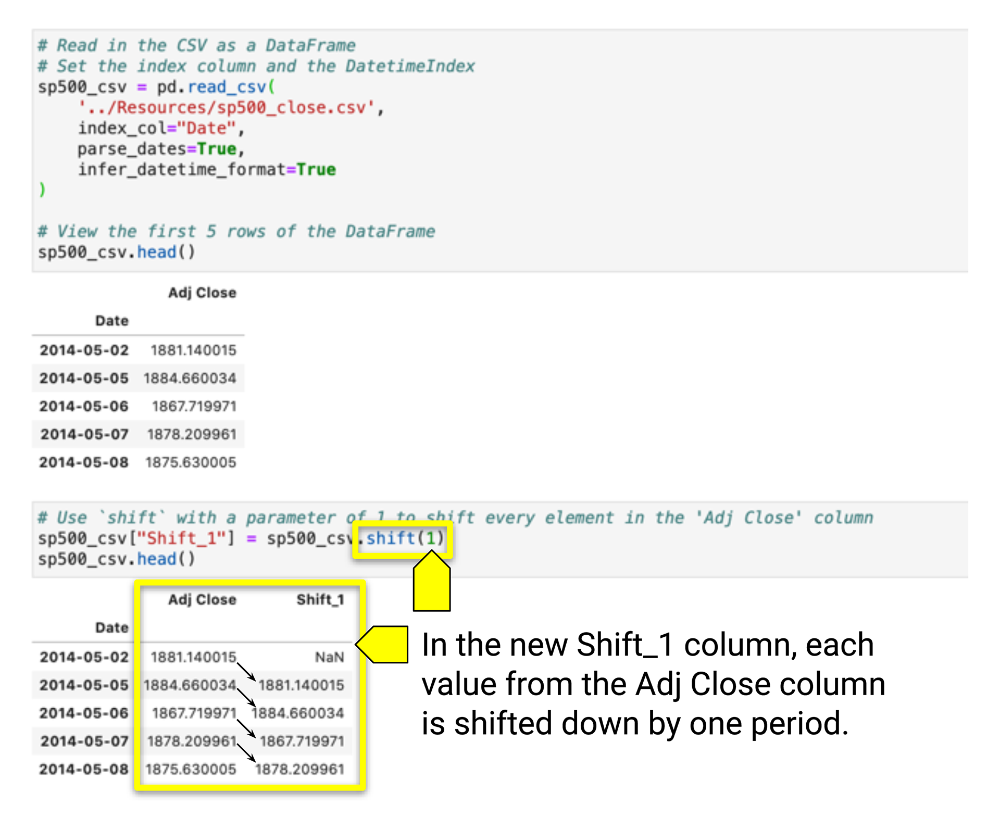

For the new Shift_1 column, the shift(1) function gets the data from the Adj Close column and shifts it down by one time period. Notice that the first element in the new Shift_1 column is a NaN value. The shift(1) function moves every element from Adj Close down by one period. No element exists to shift down to the first spot, resulting in the NaN value.


As analysts, we don’t want to create a new column in every DataFrame where we need to calculate a return. We can use the shift(1) function to access the closing price of the previous day inside a formula, like the one to calculate the daily return. From there, we just create a new daily_return DataFrame that has the daily rate-of-return calculation for each date in sp500.csv. The following code shows this:

In [ ]:
# Review the S&P 500 daily price DataFrame
sp500_csv.head()

# Create the daily_returns Dataframe from the S&P 500 prices using the shift(1) function
daily_returns = (sp500_csv - sp500_csv.shift(1)) / sp500_csv.shift(1)

# Review the daily_returns DataFrame
daily_returns.head()

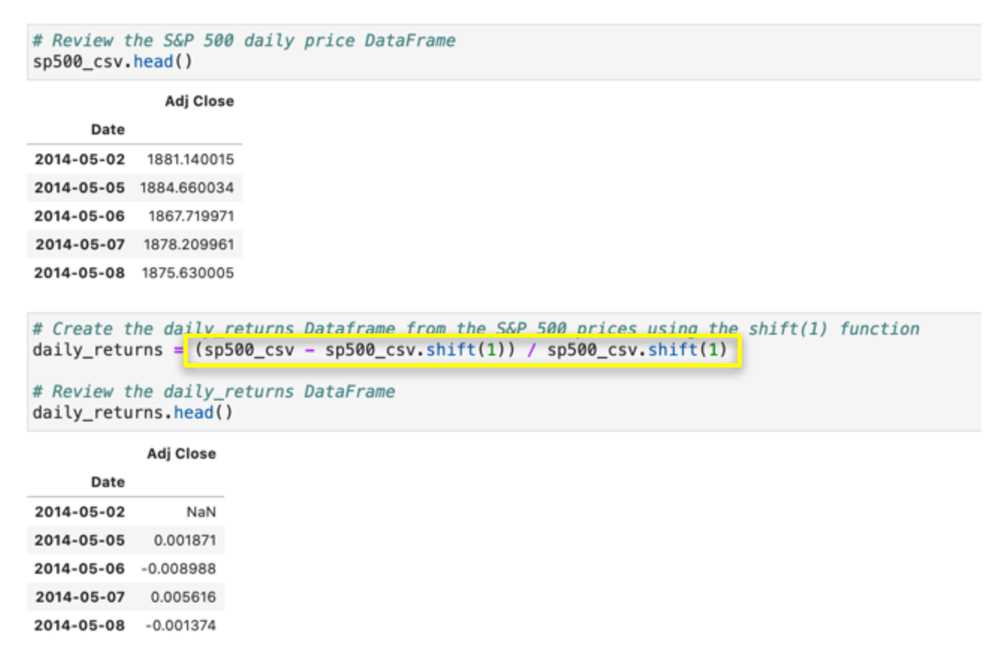

# The pct_change Function

With the `shift` function, you need to specify the number `1` to access the element that’s just before the current one. However, by default, the Pandas `pct_change` function calculates the percentage of change between the current element and the one that’s just before it in a Series, or column.

Fortunately, Pandas simplifies the process of creating daily returns even further with the `pct_change` function.



by default, the Pandas pct_change function calculates the percentage of change between the current element and the one that’s just before it in a Series, or column.

In [ ]:
# Review the S&P 500 daily price DataFrame
sp500_csv.head()

# Calculate the daily return using the 'pct_change()' function
daily_returns = sp500_csv.pct_change()

# Review the daily_returns DataFrame
daily_returns.head()

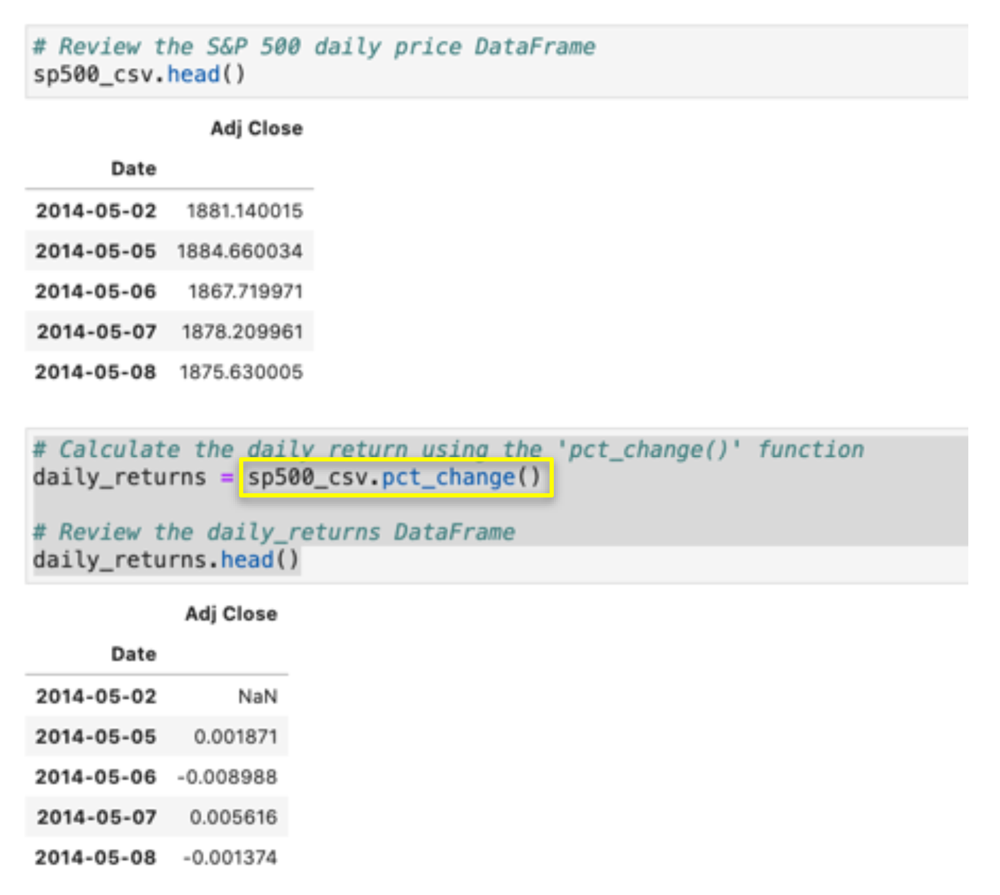

Example: https://courses.bootcampspot.com/courses/800/pages/4-dot-1-3-calculating-daily-returns-with-pandas?module_item_id=235033

# Plotting Daily Returns

With the Pandas plot function, we can create informative visualizations from Pandas DataFrames. By plotting a daily returns DataFrame, we can see the overall variability in the daily return data over the time period.

In the following image, the first plot visualizes the daily return data for the one-year period that we created by using the loc function. The second plot visualizes the three-year time period. The final plot visualizes the entire five-year period of the DataFrame:

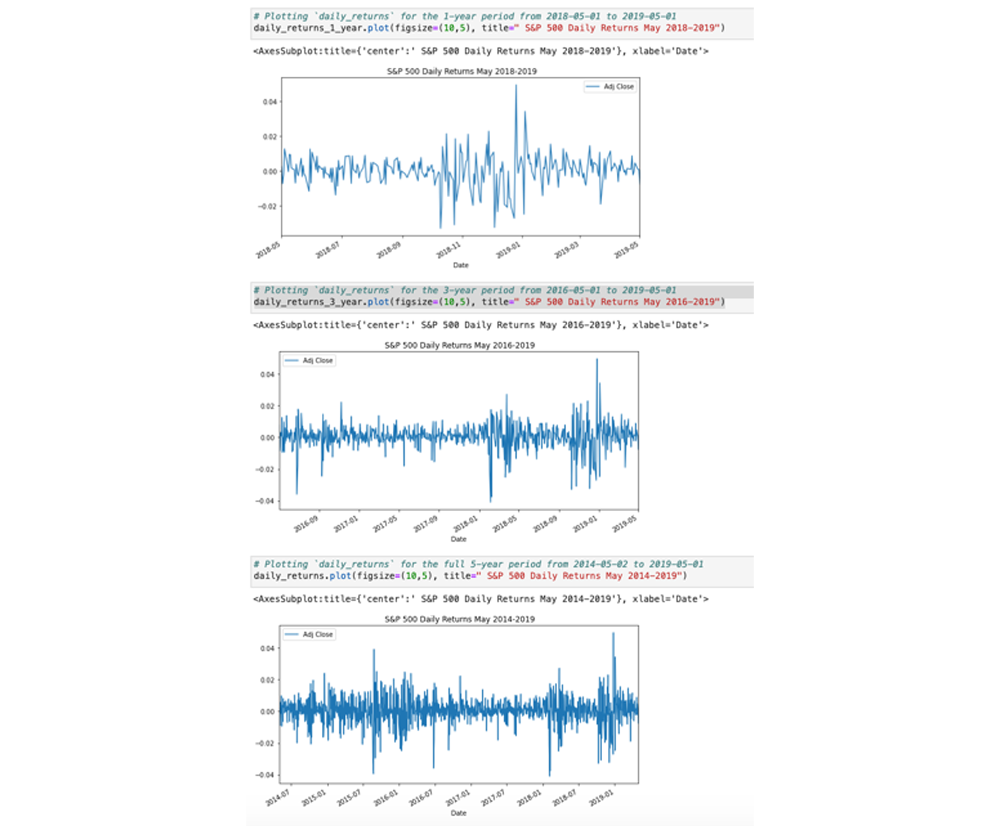

These plots illustrate the high and low spikes that relate to the daily performance of the S&P 500. We’d find it nearly impossible to detect these spikes by using the `describe` function alone to review the data.

Overall, plotting the daily return data gives us insight into both the general performance of an asset and its daily volatility. Now, it’s time to apply what you learned about calculating and plotting daily returns to a real-world fintech scenario!

# Solve this.


https://courses.bootcampspot.com/courses/800/pages/4-dot-1-5-activity-analyzing-amd?module_item_id=235039



# Start here at lecture 18.

# Calculating Cumulative Returns with Pandas

The cumulative return on an investment is the total return on that investment over a defined period of time. Think of it as an accumulation of return values for each day of the period multiplied one upon another.

To calculate the cumulative return, we can use the Pandas cumprod function. This function multiplies each number in a Pandas Series (or DataFrame column) by the next number in the series, through to the end of the series.



To apply the `cumprod` function to the `daily_returns` DataFrame, we use the following the code:

In [ ]:
# Calculate the cumulative returns using the 'cumprod()' function
cumulative_returns = (1 + daily_returns).cumprod()
cumulative_returns.head()

Each daily return value is a percentage calculation that’s expressed as a decimal. To calculate the new value of an investment based on the return value, we need to add one to the return value.

The equation to calculate the new value of a $1 investment with a 10 percent(0.10)

return is $1 × 1.10 = $1.10

Therefore, to generate the cumulative_returns DataFrame, we need to add 1 to each daily_returns value. For example, a daily return value of 0.005 becomes 1.005, allowing the multiplier that’s associated with the cumprod function to work properly. The following image shows the DataFrame that results from the cumprod function:

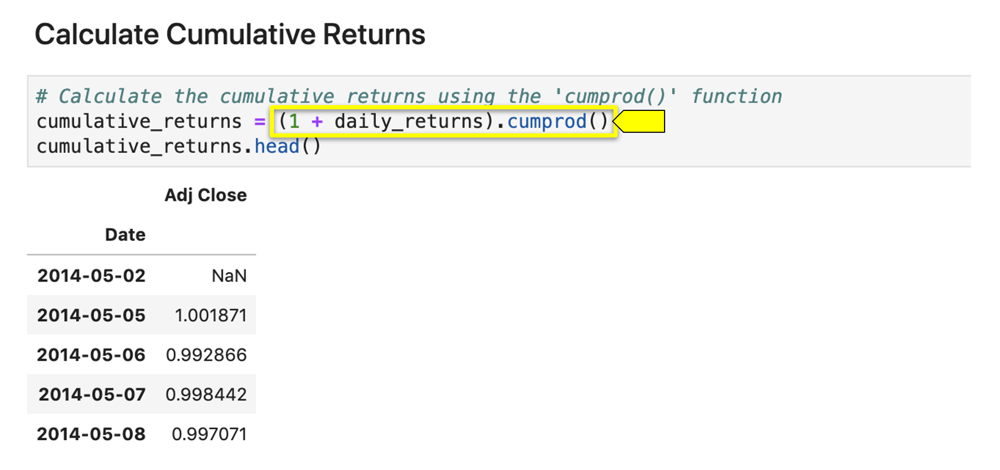

# Calculate Cumulative Returns with Pandas

As we encountered with daily returns, we can’t draw much useful information from this tabular data for cumulative turns. So, let’s plot the values to visualize the performance of the S&P 500 cumulative returns over time.

# Plot the cumulative returns of the S&P 500 over the last 5 years

In [ ]:
cumulative_returns.plot(figsize=(10,5), title="S&P 500 Cumulative Returns 2014-2019")

The resulting plot is depicted in the following image. The plot shows that the S&P 500 grew more than 50% from 2014 to 2019. The growth trajectory would have been difficult to visualize just by using the tabular data.

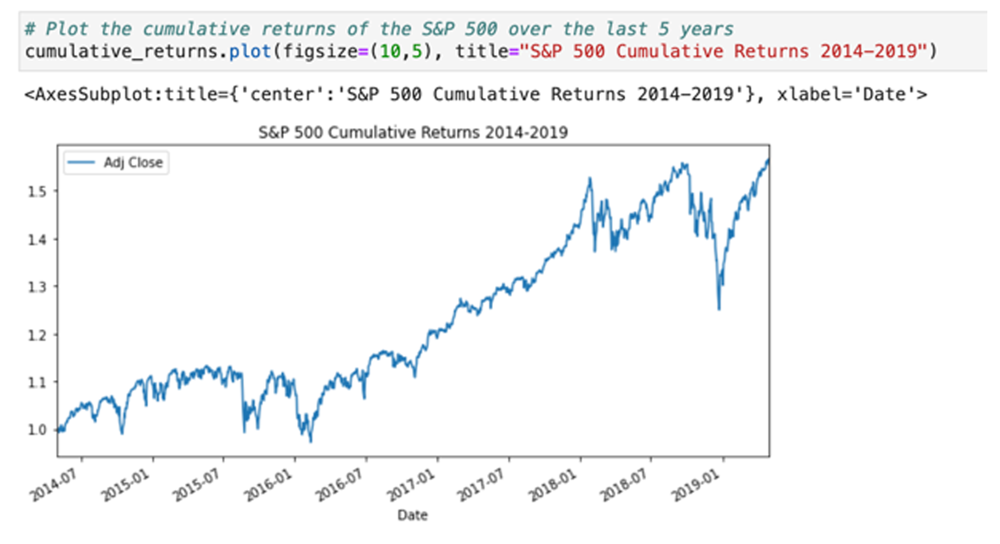

Cumulative return information proves even more valuable when we incorporate the plots for multiple assets into a single graph. We can then compare the performance across different assets and asset classes and draw insights that will aid future decisions.

# Create Overlay Plots for Cumulative Returns.

As an example, we’ll plot the performance of the S&P 500 across the three time periods to find out how time influenced the cumulative performance of the asset. Here’s the code to overlay the three plots on the same graph:

In [ ]:
ax = cumulative_returns.plot(
    legend="True",
    figsize=(10,5),
    title="S&P 500 Cumulative Returns 1, 3, & 5 years")
cumulative_returns_3_year.plot(ax=ax)
cumulative_returns_1_year.plot(ax=ax)

ax.legend(["5 year", "3 Year", "1 Year"])

Note how we set the first plot equal to a variable named ax, which stands for axes objects. In this first plot, we establish the `legend`, `figsize`, and `title` parameters.

Inside the plot function for the remaining two plots, we pass `ax = ax` as a parameter. This sets the parameters for these two plots as equal to the parameters from the first plot.

Finally, we define the plot’s legend by setting the parameter of the legend function as a list of the plot’s names in order.

The following image shows the resulting overlay plot:

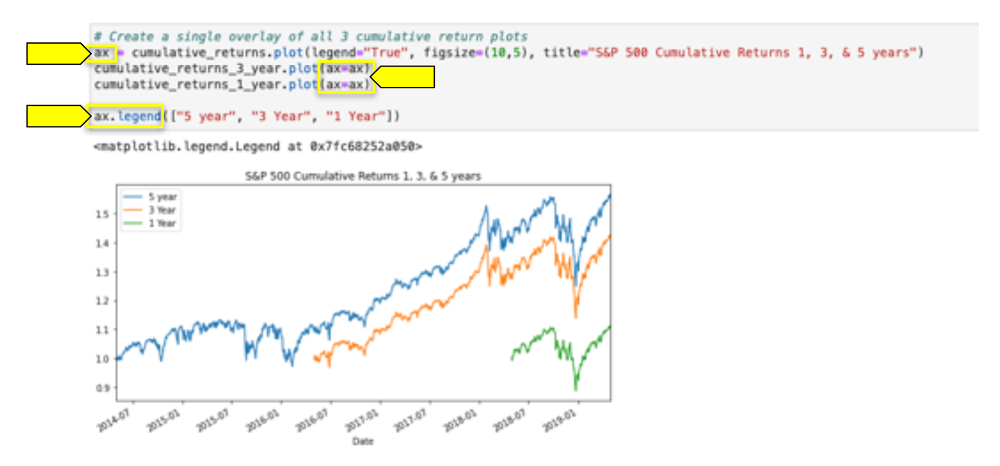

Note that each plot starts at a different point on the x-axis. This is because each DataFrame has a different start date. Each plot also occupies different spots along the y-axis, because we plotted the cumulative returns. The five-year plot had a much longer time to accumulate value than the one-year plot. Also note that the daily return behavior of the last year influences the cumulative return behavior in all three plots.

Overlaying separate plots on the same visualization always yields compelling insights!

In the Challenge, you’ll calculate and visualize cumulative return data for multiple investments. The visualizations will allow you to compare the performance of the investments over time.

So far, you’ve learned how to calculate both daily and cumulative returns for various investments. In the following activity, you’ll calculate the returns for several stocks that trade on the NASDAQ exchange to evaluate a potential investment opportunity.

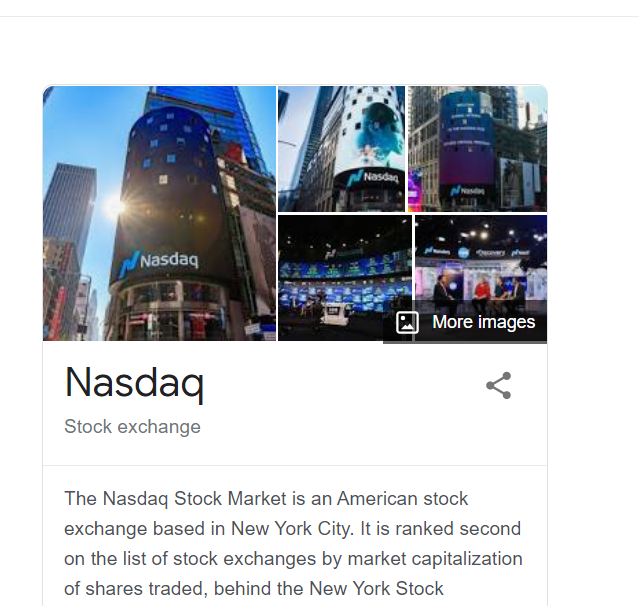

## Let us practice.

https://courses.bootcampspot.com/courses/800/pages/4-dot-1-7-activity-nasdaq-all-stars?module_item_id=235045

# Evaluating Financial Risk

You’ve taken the first steps in your quantitative analysis journey by calculating and visualizing metrics, like the daily and cumulative returns. However, quantitative financial analysts must often explore beyond the daily return data to evaluate an asset for investment. They also need to measure the asset’s risk.

In the world of investments and finance, risk is the chance that an investment’s actual return will differ from its expected or predicted return. In this context, we usually assess risk by quantifying historical patterns and outcomes. Risk helps quantify the possibility of making $20,000 from a $10,000 investment—or making $0.

We balance the risk metric of an investment by that investment’s return. Quantitative financial analysts have a primary goal of risk management. This means determining the amount of return that an investment generates for each unit of risk that’s associated with that investment. When creating an investment portfolio, we need to evaluate the risk-return relationship. The goal is to generate the largest cumulative return for the least amount of assumed risk.


Risk - Down

Return - Up.

In this lesson, you’ll use Pandas to generate statistics and visualizations. The purpose is to measure the risk of a single investment and to compare risk measures across multiple investments. By measuring risk, you can better assess and manage the risk-return profile of a portfolio. This leads to better investment results.

# Measuring Risk via the Mean and Standard Deviation

People are naturally accustomed to assessing risk. When moving, we intuitively measure our distance from other people and objects to avoid collisions. If we encounter a dog, we’ll assess whether it’s risky to pet the dog or otherwise engage it. We instinctively do these risk assessments. Our brains perform mysterious, qualitative calculations based on prior information and experience that allow us to make decisions.

As fintech professionals, we need a quantitative way to measure risk that goes well beyond our hunches.

In this section, you’ll explore two key metrics that we often use together to quantify investment risk: the mean and the standard deviation.

- Mean
- Std

# Measure Risk via the Mean
One metric that we use to quantify risk is the mean, or the average value, of a stock or portfolio over time. 

The mean serves as a baseline for the performance of an asset over a particular time period. Once we establish this baseline, we can measure how a stock performs relative to the baseline. For example, we consider an asset with dramatic daily fluctuations from the baseline riskier than one with consistent, smaller movements.

Assume that we want to calculate the mean of a Series of numbers (that is, a single column of numbers in a DataFrame). We sum the values in the Series and then divide the sum by the Series count (that is, the number of elements in the Series). The following code shows an example:

In [8]:
import pandas as pd
# Calculating the mean using ‘sum’ and ‘count’
stock_abc = pd.DataFrame({'close': [11.25, 11.98, 10.74, 11.16, 12.35, 12.87, 13.03]})
stock_abc 

,close
0,11.25
1,11.98
2,10.74
3,11.16
4,12.35
5,12.87
6,13.03


In [2]:
stock_abc_mean_1 = stock_abc['close'].sum() / stock_abc['close'].count()

In [3]:
stock_abc_mean_1

11.911428571428571

Alternatively, we can call the Pandas mean function on the Series to get the same result, as the following code shows:

In [4]:
# Calculating the mean using 'mean'
stock_abc_mean_2 = stock_abc['close'].mean()

In [5]:
stock_abc_mean_2

11.911428571428571

We consider the mean to be a measure of central tendency, or a central value for a distribution (or Series) of values. This is a key value for assessing the risk of an asset.

# Measure Risk via the Standard Deviation.

Another metric that we use to quantify risk is the standard deviation. This measures the `volatility` of an asset’s price compared to its historical mean over a particular time period.

## REWIND

Volatility measures the movement of the price of an asset or index from its expected value. For example, if a stock has multiple large increases and decreases in its closing price over a short time period, we consider that stock volatile. 


`(We consider increases and decreases large if they’re +/− 3.0% when the average return is +0.25%.)`

A small standard deviation indicates that the daily return values of the asset don’t move far from the average. A large standard deviation indicates that the asset is quite volatile, fluctuating a lot in the daily return values.

The following image illustrates the relationship between the mean and the standard deviation. The mean is the average daily return value, and the dots that are spread out along the x-axis represent the individual daily return values:

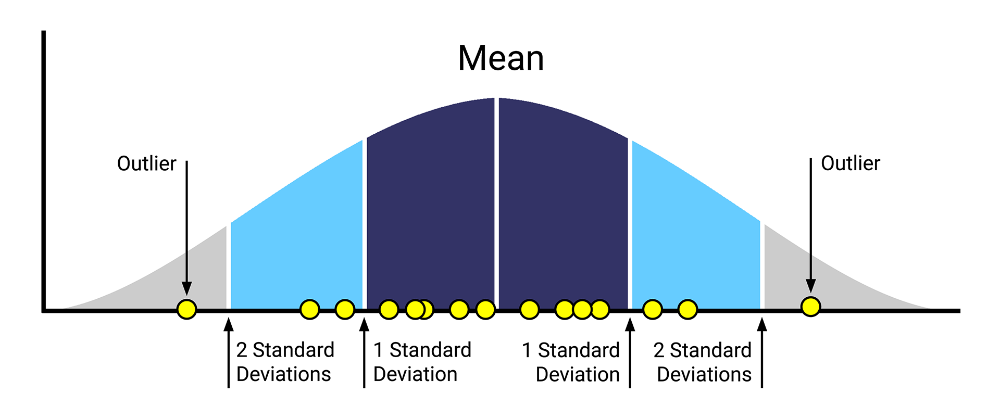

In [ ]:
mean = 100
std = 5

# PEOPLE IN A DATASET
person1 = 105
person2 = 95
person3 = 110
person4 = 90

In [10]:
dataset = pd.DataFrame({'height': [100, 200, 150, 120, 90, 100, 75, 88]})
dataset.mean()

height    115.375
dtype: float64

In [11]:
dataset.std()

height    41.192709
dtype: float64

When most of the individual daily return values exist within +/−1 standard deviation of the mean, we don’t consider the stock especially volatile. Stocks with larger standard deviations tend to have daily return values that exist far away from the mean. Outliers are return values that exist far outside the usual range of values.

Believe it or not, you’ve already learned almost everything you need to calculate the standard deviation and then use it to measure risk. The first step is to calculate the daily returns. With that information, you can use a Pandas function to produce the standard deviation. The next section more closely examines the code for this process.

The standard deviation is of prime importance in finance. For more information about using this measurement in financial calculations and analysis, refer to the Investopedia page on the standard deviation (Links to an external site.).

https://www.investopedia.com/terms/s/standarddeviation.asp

# Calculating the standard deviation.

https://courses.bootcampspot.com/courses/800/pages/4-dot-2-3-calculating-the-standard-deviation?module_item_id=235058

In [ ]:
# Calculate the standard deviation for each of the tech stocks
# call the Pandas `std` function on the `daily_returns` DataFrame
standard_deviation = daily_returns.std()

# Display results
standard_deviation.head()

Previously, we used the NumPy random function to help generate DataFrames with random numbers. In this module, we’ll use np.sqrt, which is the NumPy square root function (Links to an external site.), in our risk calculations. For more info about the NumPy library, visit the official NumPy website (Links to an external site.).

# Calculate the Standard Deviation for Stock Data.

As an example, we’ll calculate the standard deviation for some tech stock data. The following image shows the imported data displayed in a DataFrame, listing the closing values of five stocks over a range of dates:

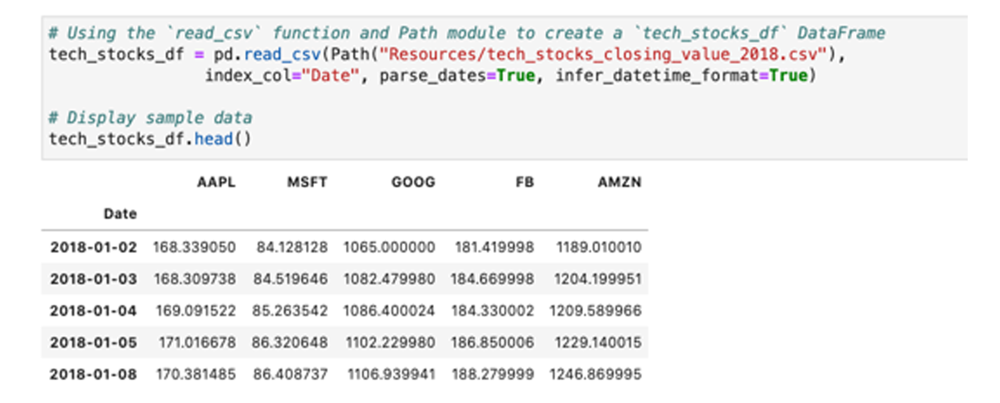

The standard in the finance industry is to calculate the standard deviation by using daily return data. In contrast to analyzing information for stocks with wildly different prices, using daily return data makes it easier to compare information across assets. For example, it’s easier to compare AAPL to AMZN stock if we know that both had a daily return value of 0.0045 vs. comparing the price change of AAPL (170.3814 to 171.1481) to that of AMZN (1246.8699 to 1252.4808).

To calculate the `daily return` data for each stock in the DataFrame, we’ll use the `pct_change` function.

REWIND:
Remember that the pct_change function uses the current date and prior data to make the calculation. The first date in the DataFrame doesn’t have a prior date to use, which results in the NaN values. As you know from the previous module, you should remove the NaN values as part of the data preparation.

Notice that the following code also uses dropna. This function removes the start date and the associated NaN values from the daily_returns DataFrame:

In [ ]:
# Calculate daily returns using Pandas ‘pct_change’  and ‘dropna’
daily_returns = tech_stocks.pct_change().dropna()

# Display sample data
daily_returns.head()

The following image shows the resulting DataFrame, which has the daily return data of the five tech stocks:

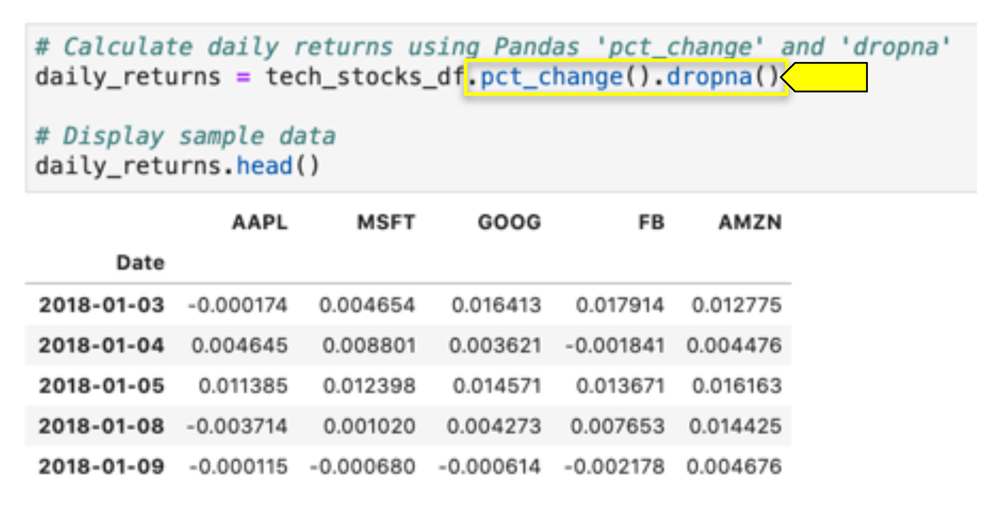

Now, we can calculate the standard deviation by using the Pandas std function. Behind the scenes, this function calculates the mean return and then evaluates how far away from the mean each of the daily_returns data points is. The following code has the calculation:

In [ ]:
# Calculate the standard deviation for each of the tech stocks
# call the Pandas `std` function on the `daily_returns` DataFrame
standard_deviation = daily_returns.std()

# Display results
standard_deviation.head()

A new DataFrame results. For each numeric Series in the original DataFrame, the new DataFrame contains a single number, which is the standard deviation. The following image shows the new DataFrame:

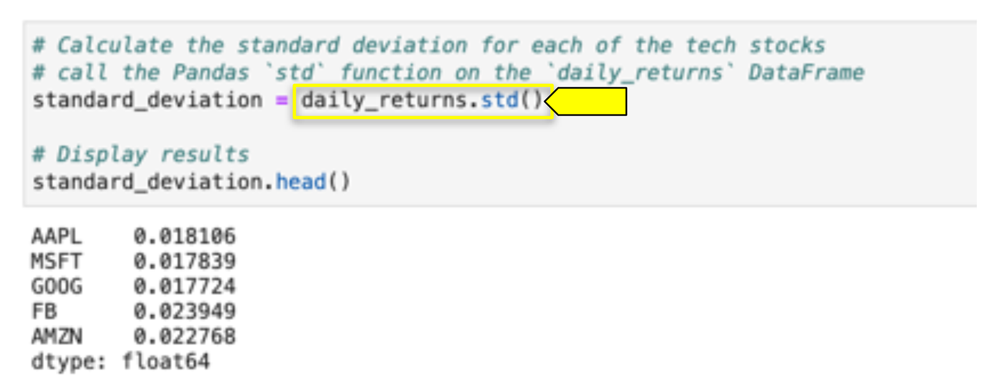

Next, we can sort this output in ascending order by using the sort_values function. This orders the assets from the smallest amount of risk to the largest, as the following code shows:

In [ ]:
# Sort the standard deviation values using Pandas 'sort_values' function
standard_deviation_sorted = standard_deviation.sort_values()

# Display results
standard_deviation_sorted

The following image shows the output:

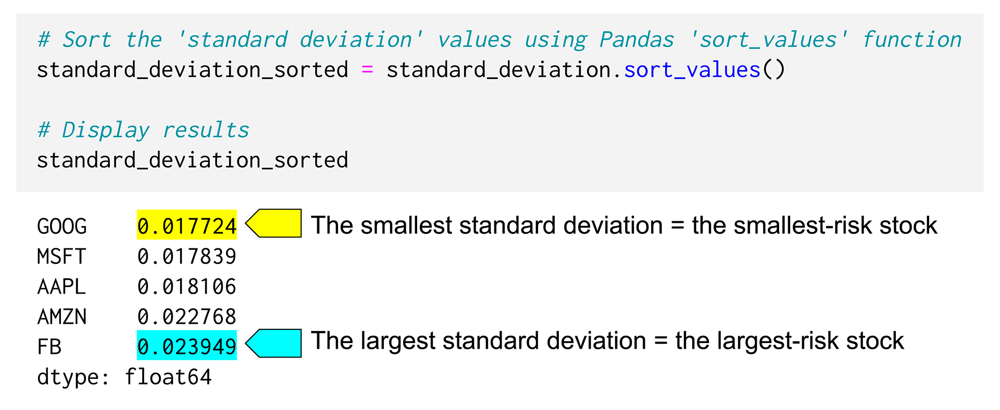

By inspecting these five values, you can observe that Facebook (FB) has the largest number, or standard deviation. This means that of the five stocks, the Facebook individual returns deviate the most from its average return. That is, Facebook is the most volatile stock and therefore the most risky. By contrast, Google (GOOG) has the smallest standard deviation, which indicates that it’s the least risky.

Let’s say that we now want to compare these values to the standard deviations of non-tech stocks or even to the market as a whole. Before we can do that, we need to dig a bit more deeply.

Generally, we measure the standard deviation for three key time periods: daily, monthly, and annually. We do this by using the daily returns, the monthly returns, and an approximation of the annualized standard deviation, respectively. Financial publications (such as The Wall Street Journal or Financial Times) often report the annualized standard deviation, because it offers the greatest insight into the long-term volatility trends for an asset. Historically, investing followed a long-term strategy, making the annualized standard deviation the most relevant for financial analysts building portfolios.

In the next section, we’ll calculate the annualized standard deviation by using the numbers that we just generated. Then, we’ll compare the standard deviations of these five stocks to gain deeper insights into their potential risks.

# Find the Annualized Standard Deviation.

We’ll calculate the annualized standard deviation (std) by using the numbers we just generated from the daily returns. To do this, we need to multiply the square root of the number of trading days in a year by the standard deviation, as the following formula shows:

annualized std = std × √ of the number of trading days in a year

We’ll calculate each annualized standard deviation by multiplying the standard deviation from the daily return data by the square root of the number of trading days. To do that, we’ll use the NumPy sqrt function, as the following code shows:

In [ ]:
# Calculate the annualized standard deviation, using the standard_deviation
# from the daily_returns DataFrame multiplied by the square root (np.sqrt)
# of the number of trading days in a year (252)
annualized_standard_deviation = standard_deviation * np.sqrt(252)

# Display the sorted results
annualized_standard_deviation.sort_values()

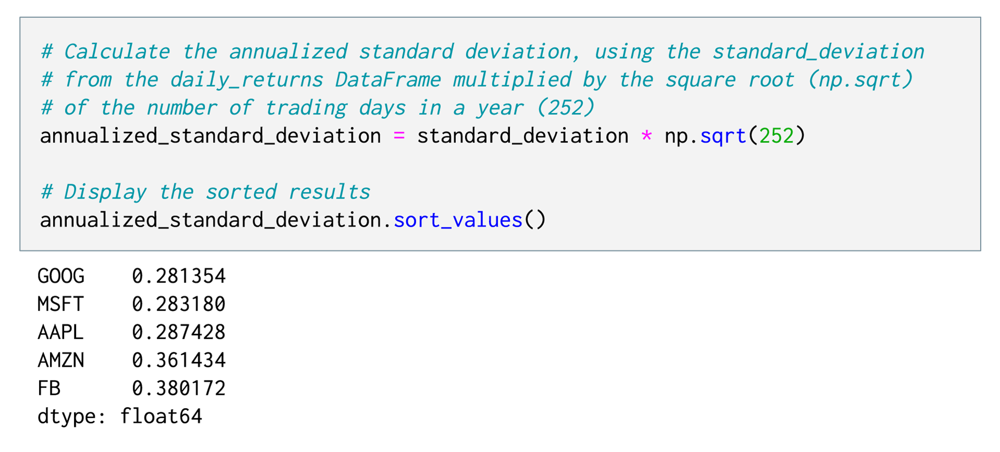

Notice that the annualized standard deviations have changed compared to the calculated standard deviations. (For example, the GOOG annualized value is 0.281354, whereas the GOOG calculated value was 0.017724). However, the order of the tech stocks from least risky (GOOG) to most risky (FB) remains the same.

Regardless of the time frame for the standard deviation calculation—that is, daily, monthly, or annually—the less risky stocks have a smaller number than the riskier stocks. Just make sure that the time frame you’re evaluating is consistent across the group of stocks. For example, you don’t want to compare the daily standard deviation of one stock to the annualized version of another!

# Visualize the Standard Deviation via Box Plots.
One of the primary visualizations that we use with measures of standard deviation is the Pandas box plot (also known as the box-and-whiskers plot). The box plot has become the standard for displaying standard deviation data, because it illustrates the total spread of the data. That is, it shows the mean value, the 50% of data that’s clustered around the mean, and the outliers. Yes, all this information is packed into one simple image! Let's find out how the box plot does this.

## Use Box Plots to Show Risk.

The following code uses Pandas to create an example box plot:

In [ ]:
# Plot box plot
portfolio_std.plot.box()

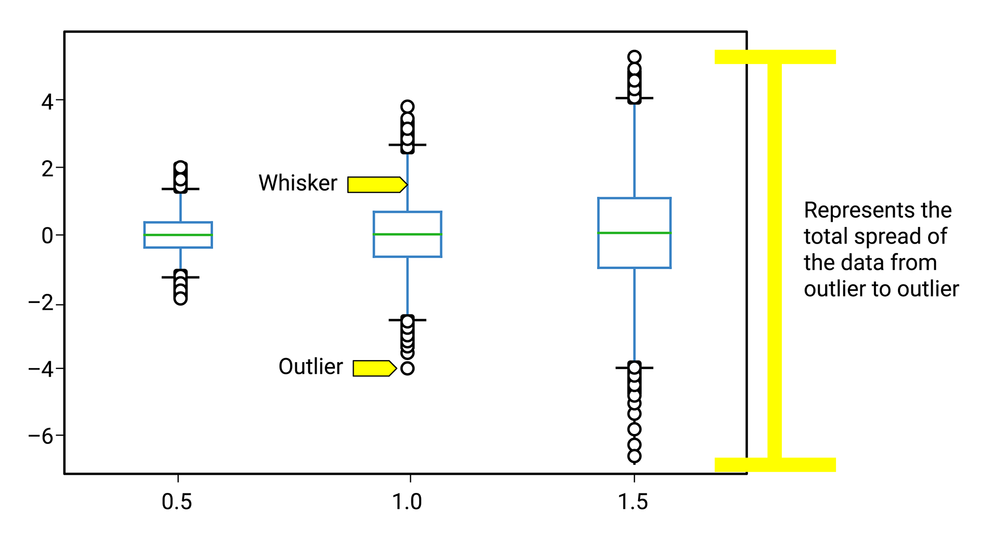

Let’s break down this plot:
- The horizontal green line in the middle of each box represents the mean value of the data.
- Each box itself represents the 50% of the data points that cluster around the mean. People often refer to this as the interquartile range. The longer the box is, the more spread out this 50% of data is. For example, if the mean is 5, and the middle data points are 4 and 6, the box will be much narrower than a box with a mean of 5 and middle data points of 1 and 9. A longer box indicates greater volatility in the daily return data.

- The vertical lines are the whiskers, which represent the range, or spread, of the data. Longer whiskers indicate greater volatility in the data.

- Any data points that extend beyond the whiskers are the outliers, which also indicate volatility and risk.

A box plot that displays a long box, long whiskers, and several outliers indicates a highly volatile and, therefore, high-risk asset.

Next, let’s create a box plot in Pandas for our daily return data.

# Create a Box Plot for Daily Returns
To generate a box plot for our daily return data, we’ll call the Pandas `plot.box` function on the `daily_returns` DataFrame, as the following code shows:

In [ ]:
# Create a Pandas box plot from the `daily_returns` DataFrame
daily_returns.plot.box(title="Box Plot of Daily Returns Data - 5 Tech Stocks")

The following image shows the resulting box plot, with one box for each of the five tech stocks:
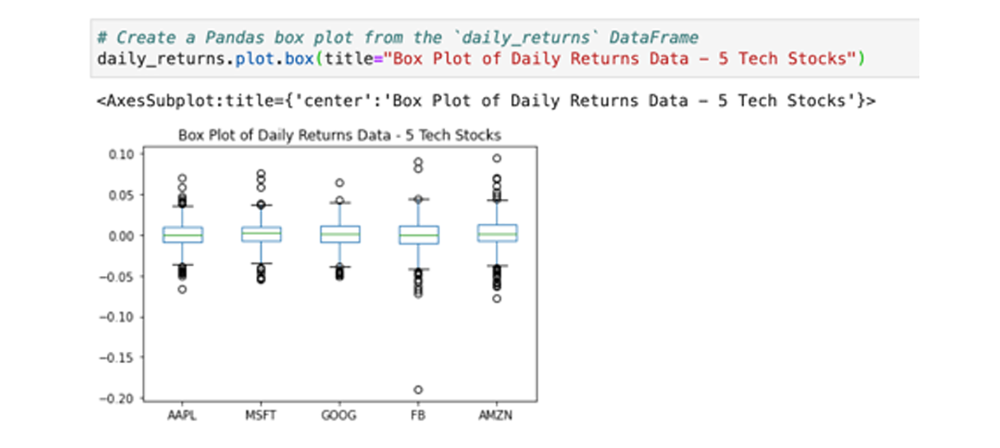



Based on this plot, it appears that the daily return data for GOOG is the least volatile. The GOOG box plot has the least number of outliers, and the whiskers seem to be among the shortest. This makes sense, because GOOG has the smallest standard deviation, which is another measure of volatility.

Additionally, FB and AMZN are in close contention for the most volatile. They both seem to have longer whiskers with several outliers. Do you notice the one FB outlier way down at the bottom of the plot? This single data point is probably what won FB the title as the most volatile of the five stocks in terms of the standard deviation.

## REWIND
Note that we used the plot.box syntax to create the box plots. (We could have used plot(kind=’box’), which would have resulted in the same plots.) We can use this type of syntax instead of the kind parameter for other types of plots, including the following:

`plot.line` (Links to an external site.)

`plot.bar` (Links to an external site.)

`plot.hist` (Links to an external site.)

`plot.density`

As you study these plots, remember that the greater the spread, the greater the risk. And, the greater the risk, the greater the potential for outsized earnings or outsized losses. (But outsized losses get more attention!)

With annualized standard deviation metrics and box plots, quantitative financial analysts can determine the potential risk that’s associated with an asset. Either stocks with large annualized standard deviations or box plots with large boxes and long whiskers can keep a portfolio manager up at night.

However, risk isn’t always about the possibility of losing money when a stock price declines or, worse, collapses. High-risk stocks can also lead to big gains. Therefore, we should evaluate risk in terms of an asset’s potential ROI. The Sharpe ratio, which we’ll explore next, is a metric that allows us to account for both risk and return in our work.

# Evaluating Risk and Return: The Sharpe Ratio.
As a quantitative analyst in the fintech industry, you need to not only evaluate the risk of an investment but also examine that risk in relation to the potential reward.

What does this mean? Let’s say that two assets have the same risk profile and the same annualized standard deviation. However, one asset has the potential of returning 10% on its investment, and the other has the potential of returning 25%. If you consider just the standard deviations without knowing the potential returns, you might think that the choice between the two assets is a toss-up. But if you know the potential returns, you’ll likely choose the asset with the potential of `25%`.

The `Sharpe ratio` is a metric that helps quantify both the risk and the potential reward of a particular investment.

The Sharpe ratio assesses risk and reward by measuring the excess return (that is, the reward, or profit) for the risk that someone assumes when investing in the asset.

# Calculate the Sharpe Ratio.
To calculate the Sharpe ratio for an investment, we first subtract the risk-free rate of that investment from its annual average return, and we then divide the result by the annualized standard deviation of the investment's return. The formula to calculate this ratio is as follows:

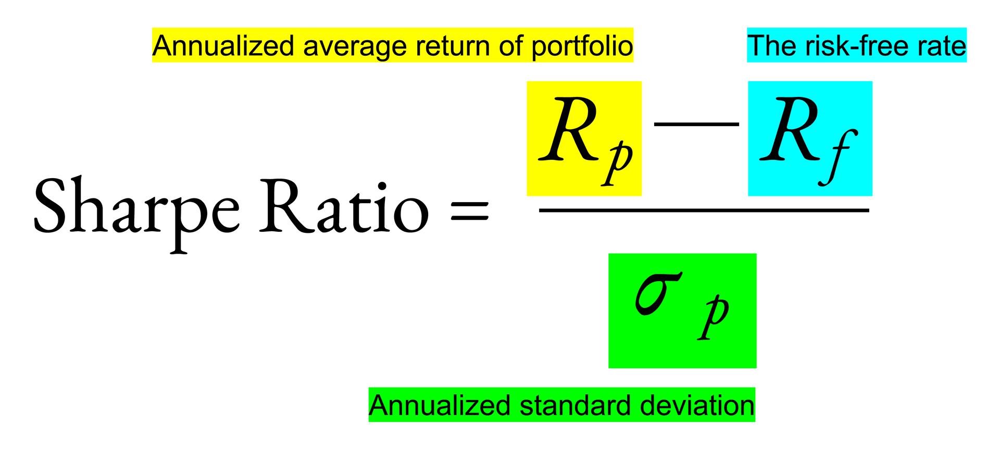



The `risk-free` rate of return is the return on an investment with zero risks. That is, it’s the return that investors can expect for taking no risk.

The greater the value of the Sharpe ratio, the more attractive the risk-adjusted return for that asset is. The Sharpe ratio can help investors judge whether an asset offers a solid investment decision.

In [ ]:
# Import the required libraries and dependencies
import pandas as pd
import numpy as np
from pathlib import Path

%matplotlib inline

In [ ]:
# Use the read_csv function and Path module to import the CSV files for Portfolios A and B
portfolio_a = pd.read_csv(
    Path("Resources/tech_stocks_2018_a.csv"),
    index_col="Date",
    parse_dates=True,
    infer_datetime_format=True
)

portfolio_b = pd.read_csv(
    Path("Resources/tech_stocks_2018_b.csv"),
    index_col="Date",
    parse_dates=True,
    infer_datetime_format=True
)

# Display the first 5 rows of data for Portfolios A and B
print("Portfolio A data")
display(portfolio_a.head())

print("----------")

print("Portfolio B data")
display(portfolio_b.head())

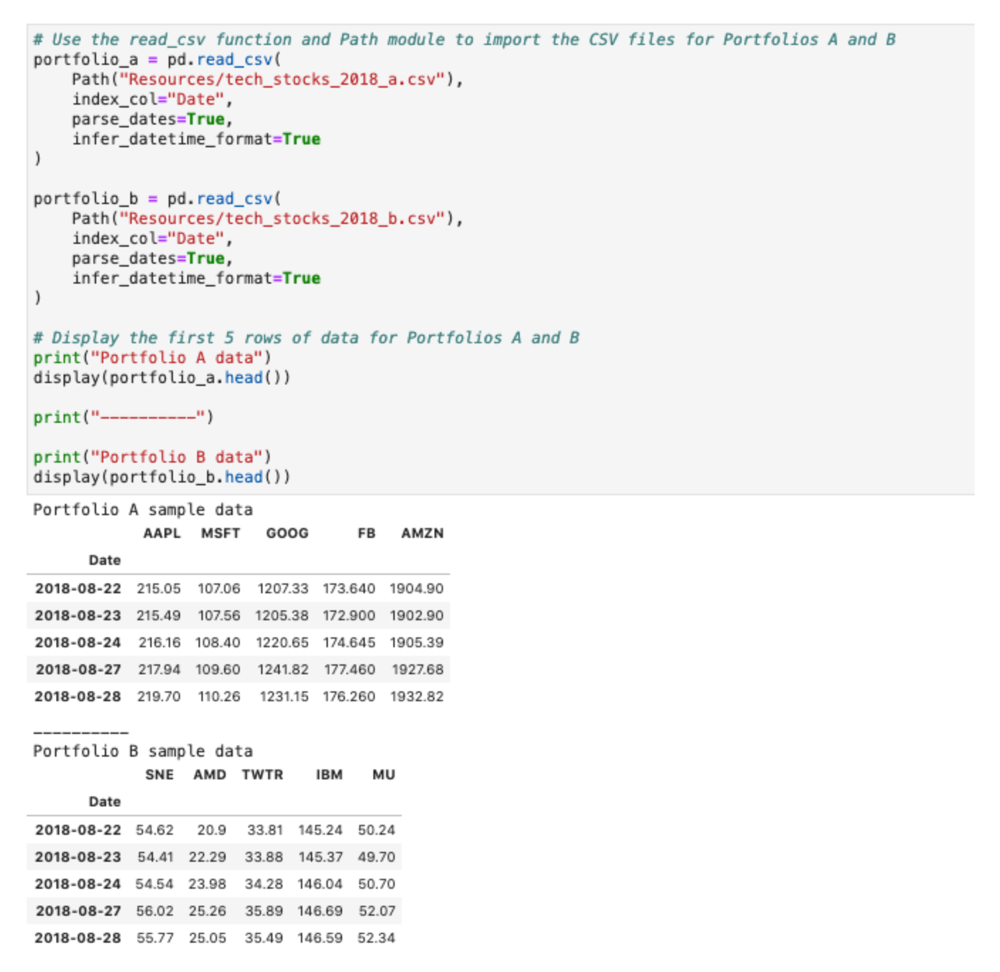

The goal is to use the Sharpe ratio to assess whether a single portfolio that combines Portfolio A with Portfolio B is a good investment option.

Because we want to evaluate the combination of portfolios, the first step is to combine the two DataFrames. We just happen to have a CSV file with the combined data. The following code imports this file into the portfolios_a_b DataFrame and then displays the first five rows of the data:

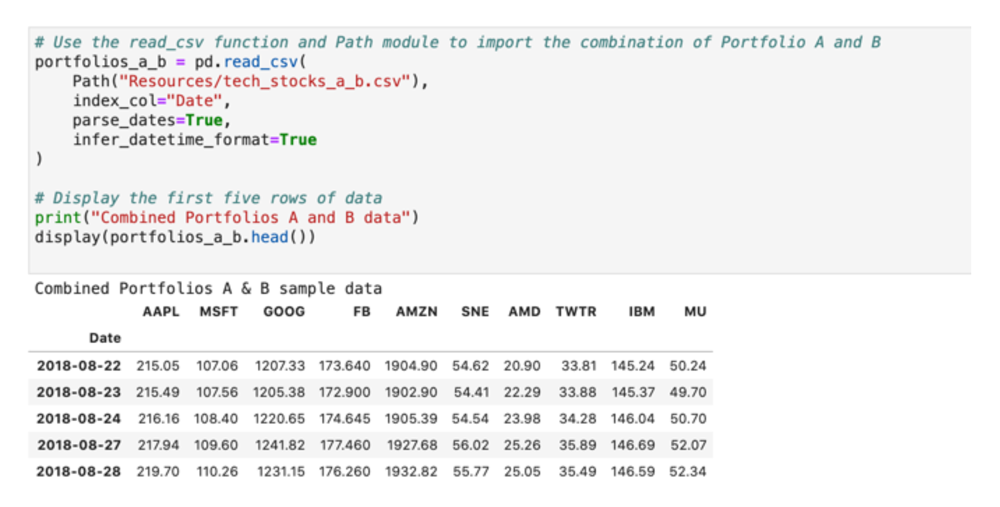

We want to generate the daily return data from this DataFrame, which contains the closing price of each stock on each specified date. We do this by combining the Pandas `pct_change` function with the `dropna` method, as the following code shows:

In [ ]:
# Calculate daily returns using the combined portfolio
daily_returns_a_b = portfolios_a_b.pct_change().dropna()

# Display sample data
daily_returns_a_b.head()

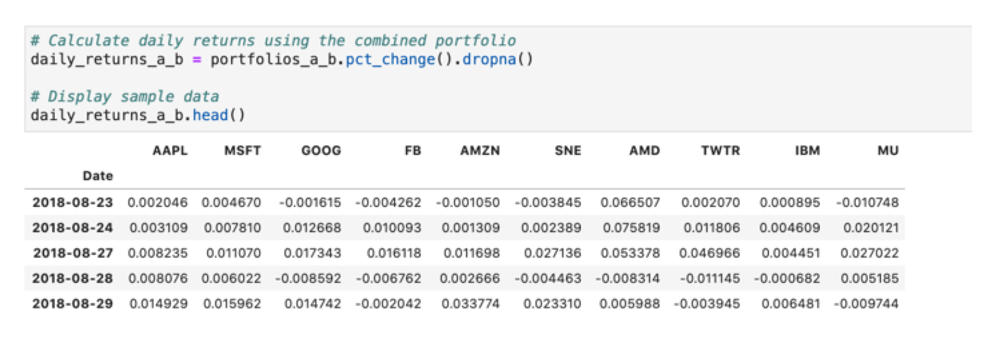

Calculating the Sharpe ratio requires that we convert our daily return data into annualized return data. Let's examine how to do that next.

# All steps.

`Before any of these steps combine the datasets, calculate the daily returns.`

- 1.Calculate the Annualized Returns.

- 2.Calculate the Annualized Standard Deviation & mean value.

- 3.Calculate and Sort the Sharpe Ratios.

- 4.Sort & Plot the Sharpe Ratios.


### Summary.
combine the datasets first, get the daily returns. then turn this daily return into an annualized return. From the annualized return get `std()`, `mean()`. From the std and mean get the sharpie ratio. Then visualize and plot.

# Calculate the Annualized Returns.
Now that we have our daily return data, the next step is to calculate the average annualized return for each asset in the combined portfolio.

To do this, we calculate the mean of the daily return values for each asset in the combined portfolio. We then multiply this value by the number of trading days in the year (252). The following code shows this equation:

In [ ]:
average_annual_return_portfolio_a_b = daily_returns_a_b.mean() * year_trading_days

In [ ]:
The following is the entire code snippet for calculating the average annualized return for each asset in the combined portfolio and then displaying the result:

# Set the number of trading days for the year
year_trading_days = 252

# To calculate the annualized average return of portfolio,
# calculate the mean of the daily return values for each stock in 'portfolio_a_b'
## and then multiply that by the number of trading days in the year
average_annual_return_portfolio_a_b = daily_returns_a_b.mean() * year_trading_days

## Display the average annual return values for each stock in 'portfolio_a_b'
average_annual_return_portfolio_a_b

The following image shows the resulting average annualized return values:

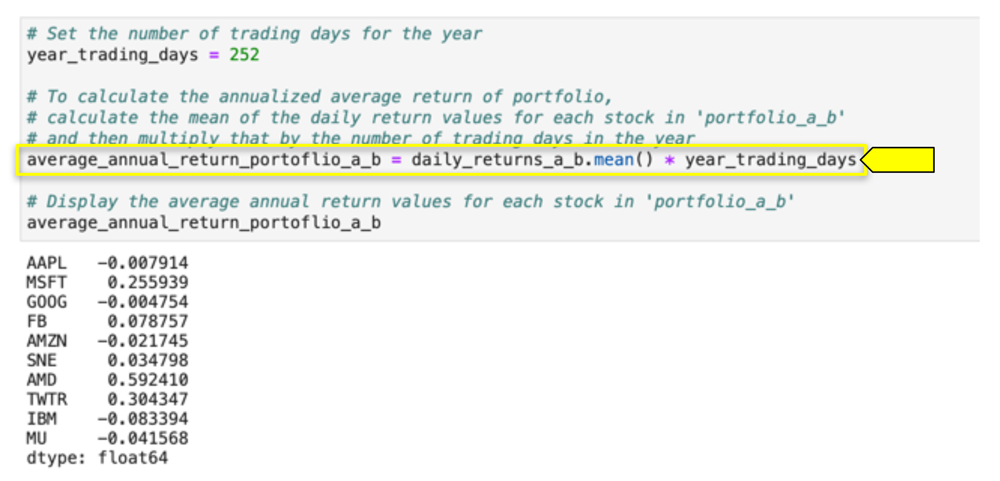

Quickly going over our numbers, we find that AMD has the greatest average annualized return at 0.592401, while IBM has the smallest at −0.083394.

Referencing the formula from earlier in the lesson, we’ll use the following equation to calculate the Sharpe ratio. Because the risk-free rate is essentially zero, we don’t need to include it in the calculation:

Sharpe ratio = Annualized average return ÷ Annualized standard deviation

We just calculated the annualized average return for each of our assets—which is the numerator in the Sharpe ratio formula. For AAPL, for example, this number is −0.007914. For MSFT, it’s 0.255939. The next step is to calculate the denominator in this formula, which is the annualized standard deviation.

# Calculate the Annualized Standard Deviation
To calculate the Sharpe ratio for each asset, we need to calculate the annualized standard deviation for each. Remember from earlier in this lesson that we calculate the annualized standard deviation with the formula in the following code: 

In [ ]:
# To calculate the annualized standard deviation,
# multiply the standard deviation (std) for the daily_returns_a_b DataFrame
# by the square root (np.sqrt) of the number of trading days in the year
annual_std_dev_portfolios_a_b = daily_returns_a_b.std() * np.sqrt(year_trading_days)

# Display the results
annual_std_dev_portfolios_a_b

Using the daily return information from the combined portfolio, we calculate the standard deviation and then multiply it by the square root of the number of trading days in a year. The following image shows the result:

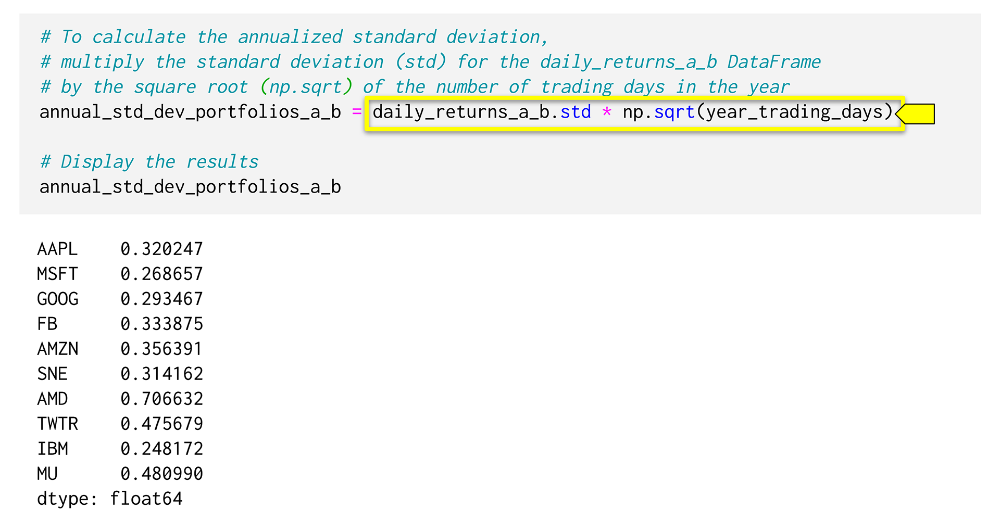

A quick review of these numbers reveals that AMD appears to be the riskiest stock, with the largest standard deviation at 0.706632. By comparison, IBM appears to have the smallest risk, with a small standard deviation of 0.248172.

# Calculate and Sort the Sharpe Ratios.
To calculate the Sharpe ratio of an asset, we divide the average annualized asset return by the annualized standard deviation.

In code, this formula becomes the following:

In [ ]:
# Display sorted results
sharpe_ratios_a_b.sort_values()

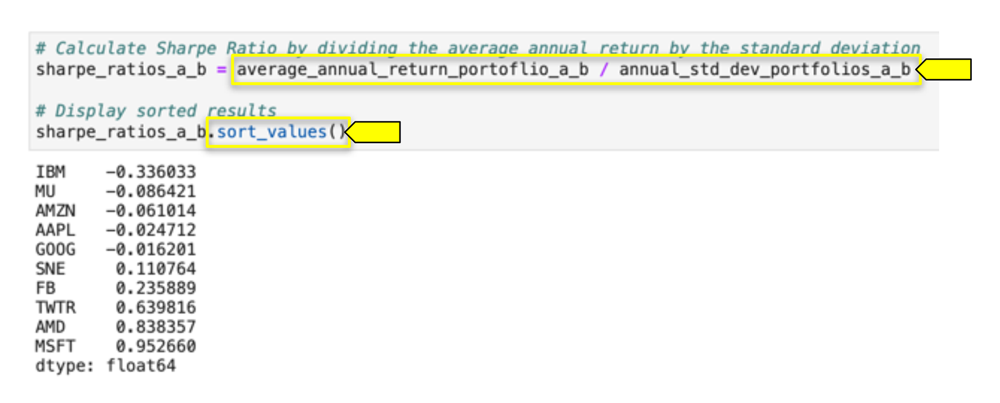

These values reveal that IBM, with a Sharpe ratio of −0.336033, has the worst risk-return profile of the group. (A negative value indicates that we expect a negative return for the assumed risk.) By comparison, MSFT has the best risk-return profile, with a Sharpe ratio of 0.952660. This means that MSFT offers a considerably better investment opportunity (from a risk-return perspective) than IBM.

But we’re not quite done! Remember how visualizations add a lot of value? Let’s find out how plotting these values impacts our analysis of the data.

# Plot the Sharpe Ratios.

In [ ]:
sharpe_ratios_a_b.plot.bar(title="Sharpe Ratios")

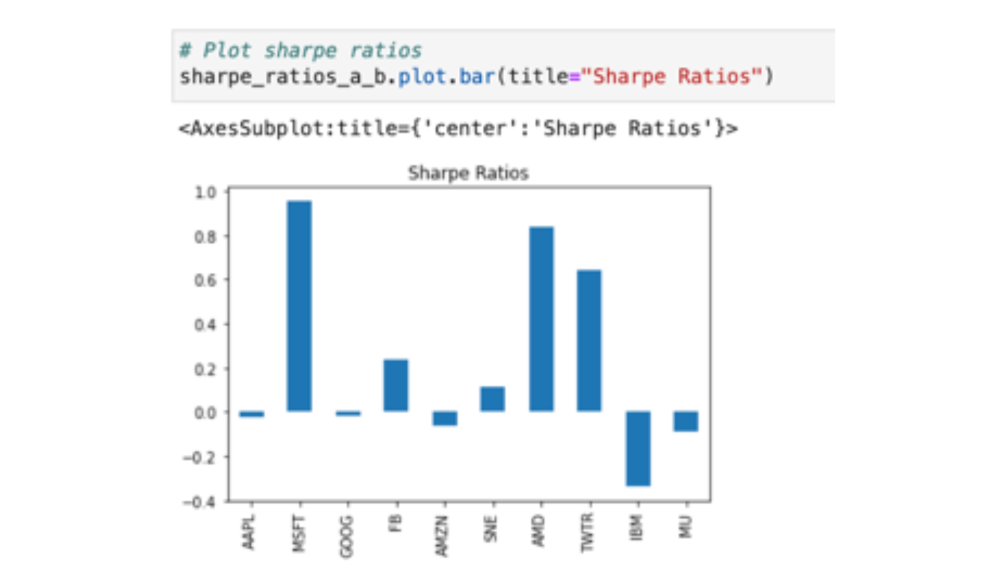

This information doesn’t change our overall analysis. MSFT still has a larger Sharpe ratio and a better risk-return profile than IBM. However, this bar chart reveals some significant differences and relationships among the stocks. Specifically, we can observe two things. First, IBM offers a worse risk-return profile by quite a bit. Second, MSFT has some competition from AMD and TWTR.

This lesson covered a lot—from standard deviations to Sharpe ratios. Now, the challenge for you as a new quantitative analyst is to put all the pieces together. In the following activity, you’ll apply your new skills to evaluate a portfolio for a fintech firm.

# Practice.
https://courses.bootcampspot.com/courses/800/pages/4-dot-2-5-activity-a-risky-venture?module_item_id=235064

# End of lecture.